# Data Augmentation in Deep Learning

In [1]:
# For downloading files from URLs
import urllib

# TensorFlow library
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers

# Enable Autotuning for TensorFlow data pipeline optimization
AUTOTUNE = tf.data.experimental.AUTOTUNE

# Documentation utilities for TensorFlow
import tensorflow_docs as tfdocs
import tensorflow_docs.plots

# TensorFlow Datasets library for accessing pre-built datasets
import tensorflow_datasets as tfds

# Python Imaging Library for image processing
import PIL.Image

# Matplotlib for data visualization
import matplotlib.pyplot as plt
import matplotlib as mpl

# Set default figure size for Matplotlib
mpl.rcParams['figure.figsize'] = (12, 5)

# NumPy for numerical computing
import numpy as np

## Download Image

2125399/2125399 [==============================] - 3s 1us/step


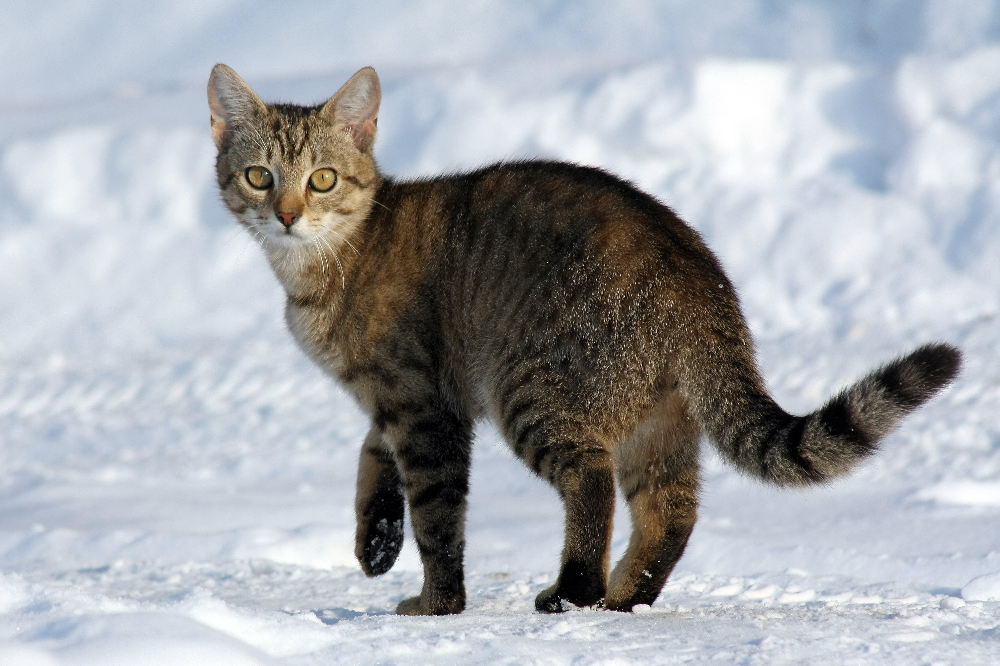

In [2]:
# Download the image from the specified URL and extract it
image_path = tf.keras.utils.get_file("cat.jpg",
                                     origin="https://upload.wikimedia.org/wikipedia/commons/b/b6/Felis_catus-cat_on_snow.jpg",
                                     extract=True)

# Open the downloaded image using PIL
PIL.Image.open(image_path)

In [3]:
# Read the image file as a string
image_string = tf.io.read_file(image_path)

# Decode the image string into a tensor
# Specify the number of color channels (3 for RGB)
image = tf.image.decode_jpeg(image_string, channels=3)

In [4]:
def visualize(original, augmented):
    # Create a new figure
    fig = plt.figure()

    # Plot the original image on the left subplot
    plt.subplot(1, 2, 1)
    plt.title('Original image')
    plt.imshow(original)

    # Plot the augmented image on the right subplot
    plt.subplot(1, 2, 2)
    plt.title('Augmented image')
    plt.imshow(augmented)

    # Show the figure with both subplots
    plt.show()

## Data Augmentation on a Single Image

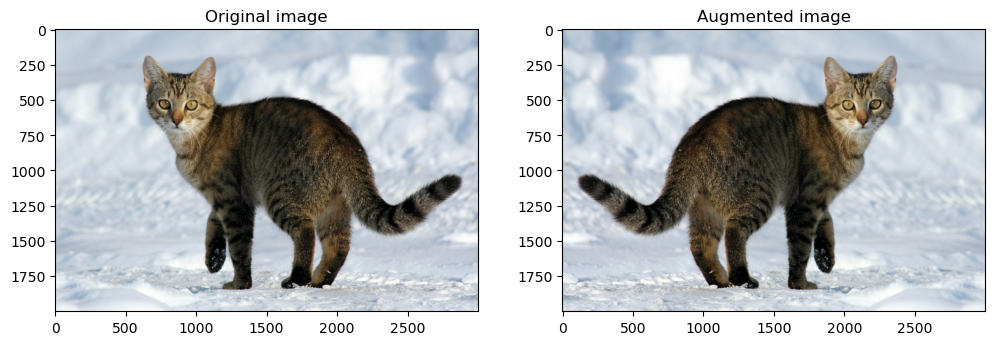

In [5]:
# Flip the original image horizontally
flipped = tf.image.flip_left_right(image)

# Visualize the original and flipped images
visualize(image, flipped)

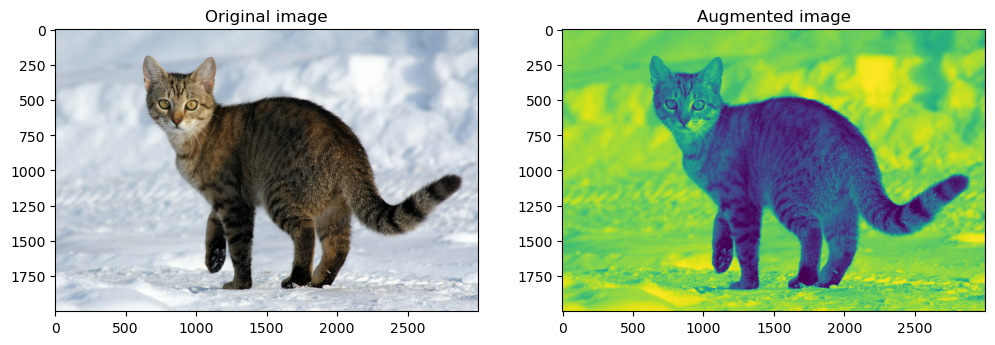

In [6]:
# Convert the original RGB image to grayscale
grayscaled = tf.image.rgb_to_grayscale(image)

# Visualize the original RGB and grayscale images
visualize(image, tf.squeeze(grayscaled))

# Show the plot without the colorbar
plt.show()

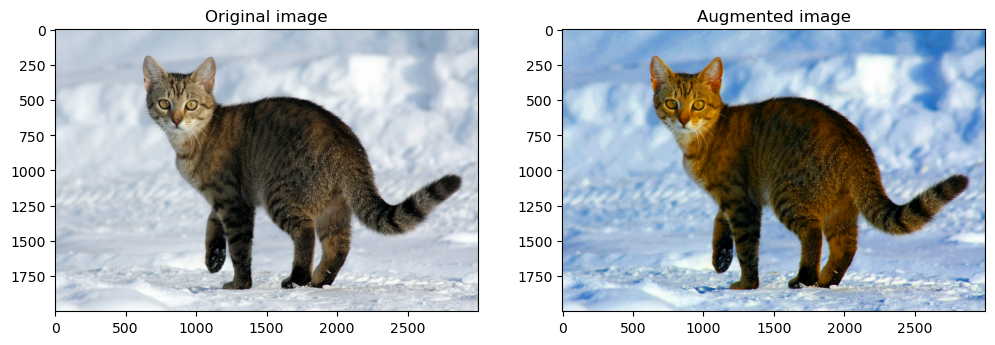

In [7]:
# Adjust the saturation of the original image
saturated = tf.image.adjust_saturation(image, 3)

# Visualize the original and saturated images
visualize(image, saturated)

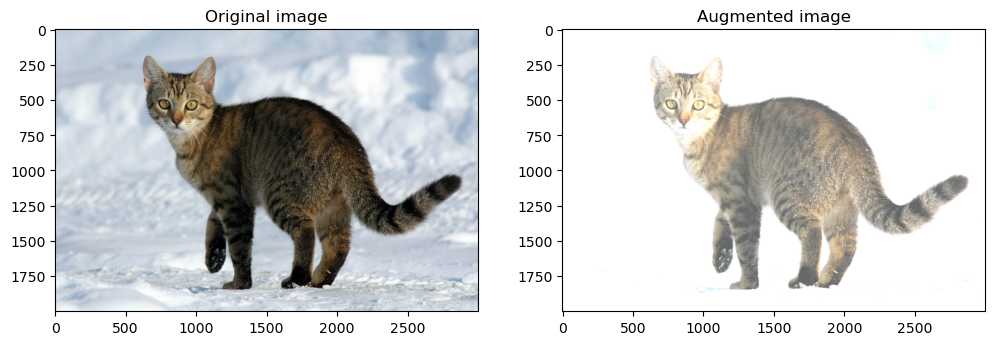

In [8]:
# Adjust the brightness of the original image
bright = tf.image.adjust_brightness(image, 0.4)

# Visualize the original and brightened images
visualize(image, bright)

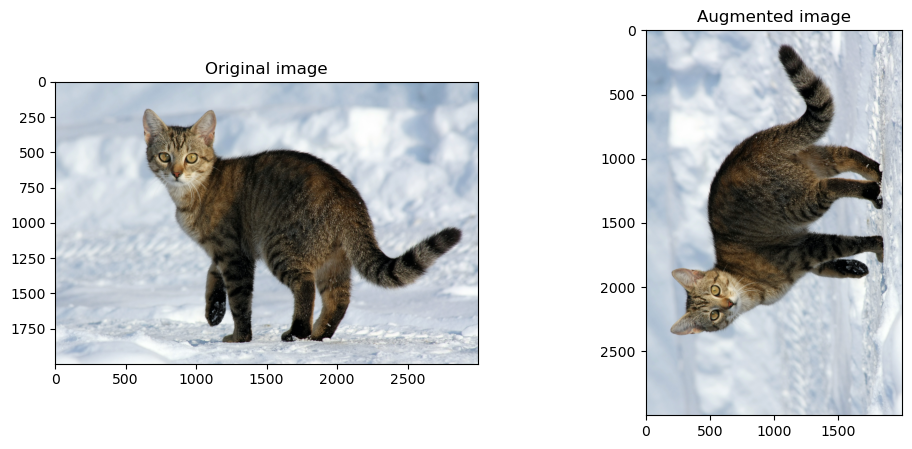

In [9]:
# Rotate the original image counterclockwise by 90 degrees
rotated = tf.image.rot90(image)

# Visualize the original and rotated images
visualize(image, rotated)

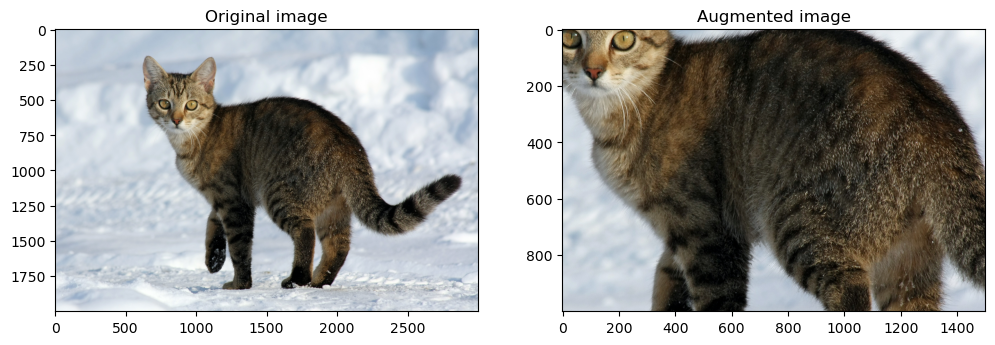

In [10]:
# Crop the central region of the original image, retaining 50% of both width and height
cropped = tf.image.central_crop(image, central_fraction=0.5)

# Visualize the original and cropped images
visualize(image, cropped)

## Data Augmentation on a Dataset and Training a Model

In [11]:
# Load the MNIST dataset and retrieve information about the dataset
dataset, info = tfds.load('mnist', as_supervised=True, with_info=True)

# Separate the dataset into training and testing subsets
train_dataset, test_dataset = dataset['train'], dataset['test']

# Get the number of examples in the training dataset from the dataset information
num_train_examples = info.splits['train'].num_examples

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling C:\Users\USER\tensorflow_datasets\mnist\incomplete.AT8I61_3.0.1\mnist-train.tfrecord*...:   0%|     …

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling C:\Users\USER\tensorflow_datasets\mnist\incomplete.AT8I61_3.0.1\mnist-test.tfrecord*...:   0%|      …

Dataset mnist downloaded and prepared to C:\Users\USER\tensorflow_datasets\mnist\3.0.1. Subsequent calls will reuse this data.


In [12]:
def convert(image, label):
    # Cast and normalize the image to [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image, label

def augment(image, label):
    # Convert and normalize the image to [0, 1]
    image, label = convert(image, label)
    
    # Resize the image to 34x34 pixels with padding
    image = tf.image.resize_with_crop_or_pad(image, 34, 34)
    
    # Randomly crop the image back to 28x28 pixels
    image = tf.image.random_crop(image, size=[28, 28, 1])
    
    # Randomly adjust the brightness of the image
    image = tf.image.random_brightness(image, max_delta=0.5)
    
    return image, label

# Batch size for training
BATCH_SIZE = 64

# Number of examples to use
NUM_EXAMPLES = 2048

In [13]:
# Create augmented training batches using the defined pipeline
augmented_train_batches = (
    train_dataset
    # Only train on a subset of examples
    .take(NUM_EXAMPLES)
    .cache()
    .shuffle(num_train_examples // 4)
    # Apply data augmentation
    .map(augment, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [14]:
# Create non-augmented training batches using the defined pipeline
non_augmented_train_batches = (
    train_dataset
    # Only train on a subset of examples
    .take(NUM_EXAMPLES)
    .cache()
    .shuffle(num_train_examples // 4)
    # No data augmentation
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [15]:
# Create validation batches using the defined pipeline
validation_batches = (
    test_dataset
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(2 * BATCH_SIZE)
)

In [16]:
def make_model():
    model = tf.keras.Sequential([
        layers.Flatten(input_shape=(28, 28, 1)),
        layers.Dense(4096, activation='relu'),
        layers.Dense(4096, activation='relu'),
        layers.Dense(10)
    ])
    model.compile(optimizer='adam',
                  loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])
    return model

## Training the Model

In [17]:
# Create the model without data augmentation
model_without_aug = make_model()

# Train the model on non-augmented training batches
no_aug_history = model_without_aug.fit(non_augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50



32/32 [==============================] - 29s 739ms/step - loss: 0.7310 - accuracy: 0.7583 - val_loss: 0.3398 - val_accuracy: 0.8916
Epoch 2/50
32/32 [==============================] - 23s 720ms/step - loss: 0.1720 - accuracy: 0.9482 - val_loss: 0.2977 - val_accuracy: 0.9172
Epoch 3/50
32/32 [==============================] - 23s 740ms/step - loss: 0.1023 - accuracy: 0.9707 - val_loss: 0.2847 - val_accuracy: 0.9220
Epoch 4/50
32/32 [==============================] - 28s 887ms/step - loss: 0.0540 - accuracy: 0.9829 - val_loss: 0.2922 - val_accuracy: 0.9280
Epoch 5/50
32/32 [==============================] - 25s 792ms/step - loss: 0.0219 - accuracy: 0.9917 - val_loss: 0.3717 - val_accuracy: 0.9160
Epoch 6/50
32/32 [==============================] - 26s 839ms/step - loss: 0.0434 - accuracy: 0.9834 - val_loss: 0.3524 - val_accuracy: 0.9207
Epoch 7/50
32/32 [==============================] - 27s 851ms/step - loss: 0.0441 - accuracy: 0.9868 - val_loss: 0.5134 - val_accuracy: 0.8935
Epoch 8/50

In [18]:
# Create the model with data augmentation
model_with_aug = make_model()

# Train the model on augmented training batches
aug_history = model_with_aug.fit(augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 29s 792ms/step - loss: 2.5371 - accuracy: 0.2803 - val_loss: 1.2803 - val_accuracy: 0.6294
Epoch 2/50
32/32 [==============================] - 28s 899ms/step - loss: 1.4148 - accuracy: 0.5195 - val_loss: 0.9726 - val_accuracy: 0.6388
Epoch 3/50
32/32 [==============================] - 25s 809ms/step - loss: 1.0610 - accuracy: 0.6309 - val_loss: 0.5036 - val_accuracy: 0.8583
Epoch 4/50
32/32 [==============================] - 29s 932ms/step - loss: 0.8436 - accuracy: 0.7041 - val_loss: 0.4229 - val_accuracy: 0.8823
Epoch 5/50
32/32 [==============================] - 22s 710ms/step - loss: 0.7394 - accuracy: 0.7476 - val_loss: 0.3822 - val_accuracy: 0.8867
Epoch 6/50
32/32 [==============================] - 21s 671ms/step - loss: 0.6400 - accuracy: 0.7827 - val_loss: 0.3217 - val_accuracy: 0.9064
Epoch 7/50
32/32 [==============================] - 24s 755ms/step - loss: 0.5127 - accuracy: 0.8276 - val_loss: 0.2706 - val_accuracy: 0.9178

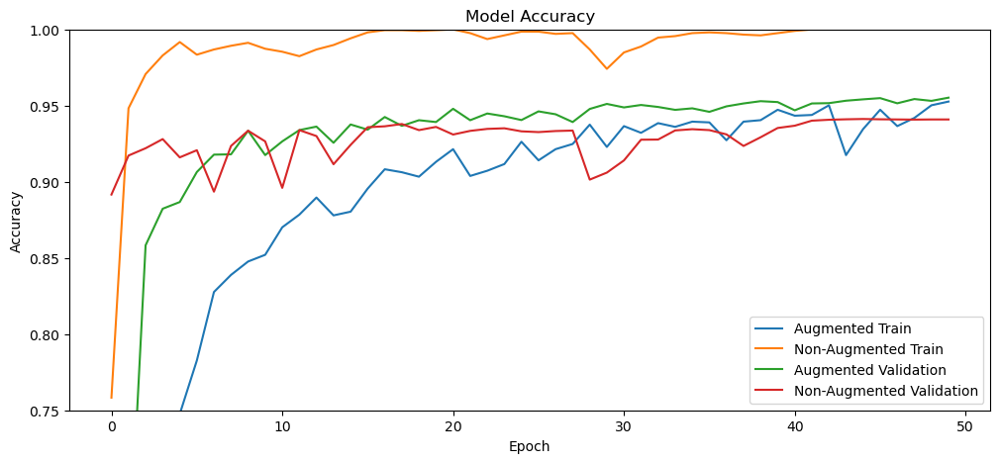

In [20]:
# Plot the accuracy from both training histories
plt.plot(aug_history.history['accuracy'], label='Augmented Train')
plt.plot(no_aug_history.history['accuracy'], label='Non-Augmented Train')

# Plot the validation accuracy
plt.plot(aug_history.history['val_accuracy'], label='Augmented Validation')
plt.plot(no_aug_history.history['val_accuracy'], label='Non-Augmented Validation')

# Set plot title and labels
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.ylim([0.75, 1])

# Show the plot
plt.show()